<a href="https://colab.research.google.com/github/sanjay235/Sketch2Color-anime-translation/blob/master/Sketch2Color_Anime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Problem statement:


---


**Anime sketch colorization**

* The task is to generate a compatible colored anime image from a given black-and-white anime sketch with help of Generative Adversarial Networks(GANS).

## References:

[1] Reference paper given by team : https://arxiv.org/abs/1705.01908

[2] Dataset : https://www.kaggle.com/ktaebum/anime-sketch-colorization-pair 

[3] https://github.com/soumith/ganhacks

[4] https://machinelearningmastery.com

[5] https://www.geeksforgeeks.org/python-docstrings/

## Loading libraries and data:

In [117]:
!pip install pyunpack

In [118]:
from tensorflow.keras.layers import Conv2DTranspose, Conv2D, Dense, Input, BatchNormalization, Dropout
from tensorflow.keras.layers import ReLU, LeakyReLU, concatenate, Input, GlobalAveragePooling2D
from tensorflow.keras.models import save_model, load_model
from tensorflow.keras.activations import tanh, sigmoid
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
from tensorflow.keras import Model
import tensorflow as tf

import matplotlib.pyplot as plt
# from google.colab import files
from datetime import datetime
from pyunpack import Archive
from IPython import display
from PIL import Image
import numpy as np
import imageio
import random
import glob
import math

"""
Setting GPU growth configuration so as to avoid memory leaks
""" 
# config = tf.ConfigProto()
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = .23

"""
Setting the seed for all random generators
""" 
rand_seed = random.randint(0, 2 ** 31 - 1)

tf.compat.v1.set_random_seed(rand_seed)
np.random.seed(rand_seed)
random.seed(rand_seed)

In [119]:
"""
Getting access to the google drive in colab for the dataset. 
"""
from google.colab import drive
drive.mount('/content/drive')

"""
Extracting the data from compressed zip file.
"""
Archive('drive/My Drive/Sketch2Image/AnimeData.zip').extractall('.')

ModuleNotFoundError: No module named 'google.colab'

(512, 512)


/tmp/ipykernel_3624817/472782196.py:14: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  for ax, i in zip(a, [img, img.resize((512, 512), Image.LANCZOS), img2, img2.resize((512, 512), Image.LANCZOS)]):


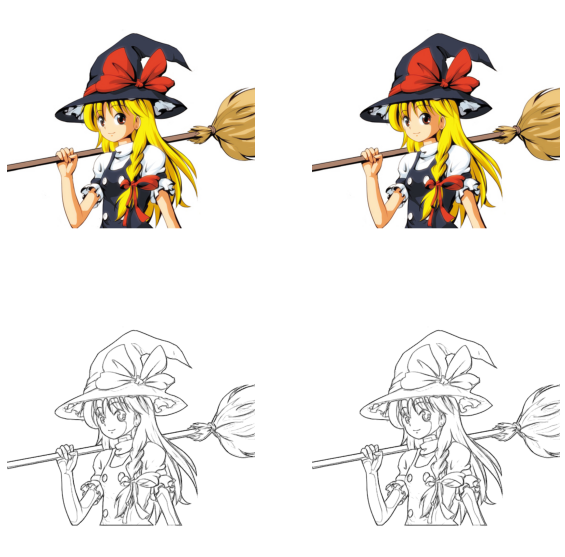

In [120]:
"""
Displaying the sample sketches and color images.
"""
img = Image.open('trainData/Images/235.png').convert('RGB')
img2 = Image.open('trainData/Sketches/235.png').convert('RGB')
# img = Image.open('Images/235.png').convert('RGB')
# img2 = Image.open('Sketches/235.png').convert('RGB')

print(img.size)

f,a = plt.subplots(2, 2, figsize=(10,10))
a = a.flatten()

for ax, i in zip(a, [img, img.resize((512, 512), Image.LANCZOS), img2, img2.resize((512, 512), Image.LANCZOS)]):
  ax.imshow(i)
  ax.axis('off')

plt.subplots_adjust(wspace=.2, hspace=.2)
plt.show()

## Encoder and Decoder Utils:

In [121]:
"""
Displaying the Convolution and Convolution transpose block architechtures.
no need to run
"""
conv = Image.open('GAN Architectures/Convolution.PNG').convert('RGB')

convTrans = Image.open('GAN Architectures/ConvolutionTranspose.PNG').convert('RGB')

f, a = plt.subplots(1, 2, figsize=(13, 10)); a = a.flatten();
for ax, img, blk in zip(a, [conv, convTrans], ['Convolution Block', 'Convolution Transpose Block']):
    ax.imshow(img)
    ax.set_title(blk)
    ax.axis('off')

plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'GAN Architectures/Convolution.PNG'

In [122]:
def convBlock(inp, n_filters, filter_size=4, stride=2, dropout=False, activation=True, BN=True, padding='same', alpha=.2):
  """
  A Convolution Block.

  This function forms the convolutional block used for upsampling 
  in the encoder part of generator & discriminator which has strided convolution operation, 
  followed by Batch Normalization and LeakyReLU activation.

  Parameters: 
    inp (Tensor): Input tensor for the convolution layer.
    
    n_filters (int): Number of filters/kernels for the convolution layer.
    
    filter_size (int): Size of the filters/kernels for the convolution layer.
    
    stride (int): Amount of stride required for filters/kernels of the convolution layer.
    
    dropout (float): Drop out rate for regularizarition.
    
    activation (boolean): Activation on a layer output for the non-linearity.
    
    BN (boolean): Batch Normalization to be applied between intermediate layers.
    
    padding (string): Type of padding to be used.
    
    alpha (float): The alpha value for LeakyReLu activation
  
  Returns: 
    Tensor: A output tensor from convolution layer followed by Batch Normalization and Leaky ReLU activation.
  """

  y = Conv2D(n_filters, filter_size, stride, padding, kernel_initializer=tf.keras.initializers.truncated_normal(stddev=.02))(inp)

  if BN:
    y = BatchNormalization()(y)

  if activation:
    y = LeakyReLU(alpha=alpha)(y)

  print(y.shape)
  return y

def convTransBlock(inp, n_filters, filter_size=4, stride=2, convOut=None, dropout=False, activation=True, BN=True, padding='same', alpha=.2):
  """
  A Convolution Transpose Block.

  This function forms the convolutional transpose block 
  used for upsampling in the decoder part of generator which has strided convolution transpose operation, 
  followed by Batch Normalization, drop out and LeakyReLU activation.

  Parameters: 
    inp (Tensor): Input tensor for the convolution layer.
    
    n_filters (int): Number of filters/kernels for the convolution layer.
    
    filter_size (int): Size of the filters/kernels for the convolution layer.
    
    stride (int): Amount of stride required for filters/kernels of the convolution layer.
    
    convOut (Tensor): The output tensor of corresponding encoder layer in generator for skip connection.
    
    dropout (float): Drop out rate for regularizarition.
    
    activation (boolean): Activation on a layer output for the non-linearity.
    
    BN (boolean): Batch Normalization to be applied between intermediate layers.
    
    padding (string): Type of padding to be used.
    
    alpha (float): The alpha value for LeakyReLu activation.
  
  Returns: 
    Tensor: A output tensor from convolution transpose layer followed by Batch Normalization and Leaky ReLU activation.
  """
  
  y = Conv2DTranspose(n_filters, filter_size, stride, padding,\
                      kernel_initializer=tf.keras.initializers.truncated_normal(stddev=.02))(concatenate([inp, convOut]) if convOut is not None else inp)

  if BN:
    y = BatchNormalization()(y)

  if dropout:
    y = Dropout(rate=dropout)(y)
  
  if activation:
    y = LeakyReLU(alpha=alpha)(y)

  print(y.shape)
  return y

## Generator:

In [0]:
"""
Displaying the generator architechture.
"""
gen = Image.open('GAN Architectures/Generator.PNG').convert('RGB')

plt.figure(figsize=(10, 10))
plt.imshow(gen)
plt.axis('off')
plt.show()

In [123]:
def generator(drop_rate, alpha, inp_shape=(512, 512, 3)):
  """
  A function for creating generator model.

  This function defines the generator part of the GAN with given input shape 
  using the Convolution and Convolution Transpose Blocks defined before.
  
  Takes the sketch input with values in the range [-1, 1] and generates the colored image of the same.

  Parameters:
    drop_rate (float): The drop out rate for regularizarition.
    
    alpha (float): The alpha value for LeakyReLu activation.
    
    inp_shape (tuple): The shape of input for initializing generator.
  
  Returns:
    tensorflow.keras.Model: The generator model initialized with a U-Net type enoder and decoder.
  """
  
  n_filters = 16
  
  inp = Input(inp_shape)

  print('Encoder:')
  conv1 = convBlock(inp, n_filters, BN=False, alpha=alpha) # 256x256
  conv2 = convBlock(conv1, n_filters*2, alpha=alpha)      # 128x128
  conv3 = convBlock(conv2, n_filters*4, alpha=alpha)      # 64x64
  conv4 = convBlock(conv3, n_filters*8, alpha=alpha)      # 32x32
  conv5 = convBlock(conv4, n_filters*8, alpha=alpha)      # 16x16
  conv6 = convBlock(conv5, n_filters*8, alpha=alpha)      # 8x8
  conv7 = convBlock(conv6, n_filters*8, alpha=alpha)      # 4x4
  conv8 = convBlock(conv7, n_filters*8, alpha=alpha)      # 2x2x512

  print('Decoder:')
  deconv1 = convTransBlock(conv8, n_filters*8, alpha=alpha)                                     # 4x4
  deconv2 = convTransBlock(deconv1, n_filters*8, convOut=conv7, dropout=drop_rate, alpha=alpha) # 8x8
  deconv3 = convTransBlock(deconv2, n_filters*8, convOut=conv6, dropout=drop_rate, alpha=alpha) # 16x16
  deconv4 = convTransBlock(deconv3, n_filters*8, convOut=conv5, dropout=drop_rate, alpha=alpha) # 32x32
  deconv5 = convTransBlock(deconv4, n_filters*4, convOut=conv4, alpha=alpha)                    # 64x64
  deconv6 = convTransBlock(deconv5, n_filters*2, convOut=conv3, alpha=alpha)                    # 128x128
  deconv7 = convTransBlock(deconv6, n_filters, convOut=conv2, alpha=alpha)                      # 256x256
  deconv8 = convTransBlock(deconv7, 3, convOut=conv1, activation=False, BN=False)  # 512x512

  outp = tanh(deconv8)

  model = Model(inputs=inp, outputs=outp)

  return model

In [250]:
# m = generator()
tf.executing_eagerly()


False

## Discriminator:

In [0]:
"""
Displaying the discriminator architechture.
"""
disc = Image.open('GAN Architectures/Discriminator.PNG').convert('RGB')

plt.figure(figsize=(10, 10))
plt.imshow(disc)
plt.axis('off')
plt.show()

In [124]:
def discriminator(alpha, learning_rate, inp_shape=(512, 512, 3), target_shape=(512, 512, 3)):
  """
  A function for creating discriminator model.

  This function defines the discriminator part of the GAN with given input shape & target shape 
  using the Convolution Blocks defined before.
  
  Takes the sketch and target image/generated colored image from generator with the values in the range [-1, 1] 
  and outputs the probability of being real/fake in the range [0, 1].

  Parameters:
    alpha (float): The alpha value for LeakyReLu activation.
    
    learning_rate (float): The learning rate value for discriminator optimizer.
    
    inp_shape (tuple): The shape of input for initializing generator.
    
    target_shape (tuple): The shape of the target output image. 
  
  Returns:
    tensorflow.keras.Model: The initialized discriminator model.
  """
  
  n_filters = 16
  
  inp1 = Input(inp_shape) # sketch input
  inp2 = Input(target_shape) # colored input

  inp = concatenate([inp1, inp2]) # 512x512x6

  conv1 = convBlock(inp, n_filters, BN=False, alpha=alpha) # 256x256x64
  conv2 = convBlock(conv1, n_filters*2, alpha=alpha) # 128x128x128
  conv3 = convBlock(conv2, n_filters*4, alpha=alpha) # 64x64x256
  conv4 = convBlock(conv3, n_filters*8, alpha=alpha) # 32x32x512
  conv5 = convBlock(conv4, n_filters*8, filter_size=2, stride=1, padding='valid', alpha=alpha) # 31x31x512
  conv6 = convBlock(conv5, n_filters=1, filter_size=2, stride=1, activation=False, BN=False, padding='valid') # 30x30x1

  sigmoid_outp = sigmoid(conv6)
  
  outp = GlobalAveragePooling2D()(sigmoid_outp)

  model = Model(inputs=[inp1, inp2], outputs=outp)

  opt = Adam(learning_rate=learning_rate, beta_1=.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  
  return model

In [0]:
# m = discriminator()

## Losses:

In [125]:
"""
Downloading the VGG16 model for extracting basic features like edges, shapes.
"""
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16

vgg = VGG16(weights='imagenet')

2022-06-19 16:05:20.974688: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled


In [126]:
# https://stackoverflow.com/a/45963039/9079093

def featureLevel_loss(y, g):
  """
  A loss for features extracted from 4th layer of VGG16.

  Custom loss for extracting high level features of the target colored and generated colored images.
  Taking the difference of VGG16 layer-4 output features as per reference paper.

  Parameters:
    y (Tensor): The target images to be generated.
    
    g (Tensor): The output images by generator.
  
  Returns:
    function: The reference to the loss function of prototype that keras requires.
  """

  def finalFLoss(y_true, y_pred):
    return K.mean( K.sqrt( K.sum( K.square( y - g ) ) ) )
  
  return finalFLoss

def totalVariation_loss(y, g):
  """
  A loss for smoothness and to remove noise from the output image.

  Custom loss for getting similar colors of trained data like skin, hair. 

  Parameters:
    y (Tensor): The target images to be generated.
    
    g (Tensor): The output images by generator.
  
  Returns:
    function: The reference to the loss function of prototype that keras requires.
  """

  def finalTVLoss(y_true, y_pred):
    return K.abs( K.sqrt( K.sum(K.square(g[:, 1:, :, :] - g[:, :-1, :, :])) + K.sum(K.square(g[:, :, 1:, :] - g[:, :, :-1, :])) ) )
    # return K.mean( K.abs( K.sqrt( K.square(g[:, :-1, :-1, :] - g[:, 1:, :-1, :]) + K.square(g[:, :-1, :-1, :] - g[:, :-1, 1:, :]) ) ) )
  
  return finalTVLoss

def pixelLevel_loss(y, g):
  """
  A loss for getting proper images by comparing each pixel.

  Custom loss for Pixel2Pixel level translation so that colors don't come out the edges of generated images.

  Parameters:
    y (Tensor): The target images to be generated.
    
    g (Tensor): The output images by generator.
  
  Returns:
    function: The reference to the loss function of prototype that keras requires.
  """

  def finalPLoss(y_true, y_pred):
    return K.mean( K.abs( y - g ) )
  
  return finalPLoss


def binaryCrossEntropy(from_logits=False):
  """
  A loss for checking if generated image is similar to real colored image.

  A Simple Binary cross entropy for back propagating the error made by the discriminator to the generator.

  Parameters:
    y (Tensor): The target images to be generated.
    
    g (Tensor): The output images by generator.
  
  Returns:
    function: The reference to the loss function of prototype that keras requires.
  """
  
  def finalBCELoss(y_true, y_pred):
    return  K.mean(K.binary_crossentropy(y_true, y_pred, from_logits=from_logits), axis=-1)
  
  return finalBCELoss

In [127]:
K.resize_images(Input((512,512,3)), 224, 224, 'channels_last')

<tf.Tensor 'resize/ResizeNearestNeighbor:0' shape=(None, 114688, 114688, 3) dtype=float32>

In [128]:
tf.image.resize(Input((512,512,3)), (224, 224), tf.image.ResizeMethod.NEAREST_NEIGHBOR)

<tf.Tensor 'resize_1/ResizeNearestNeighbor:0' shape=(None, 224, 224, 3) dtype=float32>

## GAN:

In [0]:
"""
Displaying the complete GAN architechture.
"""
gan = Image.open('GAN Architectures/GAN.PNG').convert('RGB')

plt.figure(figsize=(15, 10))
plt.imshow(gan)
plt.axis('off')
plt.show()

In [129]:
# Extracting intermediate layer features keras : https://keras.io/applications/#vgg16

vgg_net1 = Model(inputs=vgg.input, outputs=ReLU()(vgg.get_layer('block2_conv2').output))
vgg_net2 = Model(inputs=vgg.input, outputs=ReLU()(vgg.get_layer('block2_conv2').output))

def define_gan(g_model, d_model, vgg_net1, vgg_net2, learning_rate,\
               pixelLevelLoss_weight=100, totalVariationLoss_weight=.0001, featureLevelLoss_weight=.01,\
               inp_shape=(512, 512, 3)):
  """
  The function for creating GAN model.

  This function defines the GAN model using the generator and discriminator 
  with discriminator weights being seized during training so that gradients
  flow only to the generator.
  
  So, that discrimnator doesn't dominates over the generator and generator never captures 
  the probability distribution of colored images.

  Parameters:
    g_model (keras.Model): The generator model initialized before.
    
    d_model (keras.Model): The discriminator model initialized before.
    
    vgg_net1 (keras.Model): The VGG16 model with layer 4 output initialized for the target images.
    
    vgg_net2 (keras.Model): The VGG16 model with layer 4 output initialized for the generated images.
    
    learning_rate (float): The learning rate for the model optimizer.
    
    pixelLevelLoss_weight (float): The weight to be given to pixel level loss.
    
    totalVariationLoss_weight (float): The weight to be given to total variation loss.
    
    featureLevelLoss_weight (float): The weight to be given to feature level loss.
    
    inp_shape (tuple): The input shape for initializing the GAN model.

  Returns:
    tensorflow.keras.Model: The initialized GAN model.
  """
  
  d_model.trainable = False

  # ======= Generator ======= #
  sketch_inp = Input(inp_shape)
  gen_color_output = g_model([sketch_inp])
	
	# ======= Discriminator ======= #
  disc_outputs = d_model([sketch_inp, gen_color_output])
  color_inp = Input(inp_shape)
	
  # =================== PixelLevel Loss =================== #
  pixelLevelLoss = pixelLevel_loss(color_inp, gen_color_output)
  
  # =================== TotalVariation Loss =================== #
  totalVariationLoss = totalVariation_loss(color_inp, gen_color_output)

  # =================== FeatureLevel Loss =================== # 
  # Output dimensions must be positive keras backend resize_images : https://stackoverflow.com/a/57218765/9079093
  
  # K.resize_images(color_inp, .4375, .4375, 'channels_last', 'bilinear')
  net1_outp = vgg_net1([tf.image.resize(color_inp, (224, 224), tf.image.ResizeMethod.BILINEAR)])
  
  # K.resize_images(gen_color_output, .4375, .4375, 'channels_last', 'bilinear') 
  net2_outp = vgg_net2([tf.image.resize(gen_color_output, (224, 224), tf.image.ResizeMethod.BILINEAR)])

  featureLevelLoss = featureLevel_loss(net1_outp,\
                                       net2_outp)
  
  # =================== CrossEntropy Loss =================== #
  crossEntropyLoss = binaryCrossEntropy()
  
  # =================== Final Model =================== #
  model = Model(inputs=[sketch_inp, color_inp], outputs=disc_outputs)
  
#   opt = Adam(lr=learning_rate, beta_1=.5)
  opt = Adam(learning_rate=learning_rate, beta_1=.5)
	
  # Single output multiple loss functions in keras : https://stackoverflow.com/a/51705573/9079093
  model.compile(loss=lambda y_true, y_pred : tf.keras.losses.binary_crossentropy(y_true, y_pred) + \
                                             pixelLevelLoss_weight * pixelLevelLoss(y_true, y_pred) + \
                                             totalVariationLoss_weight * totalVariationLoss(y_true, y_pred) + \
                                             featureLevelLoss_weight * featureLevelLoss(y_true, y_pred),\
                optimizer=opt)
	
  return model

## Build and compile models:

In [130]:
"""
Creating the generator, discriminator and finally GAN using both.
"""
g_model = generator(alpha=.2, drop_rate=.5)

d_model = discriminator(alpha=.2, learning_rate=.0002)

gan_model = define_gan(g_model, d_model, vgg_net1, vgg_net2, learning_rate=.0002,\
                       pixelLevelLoss_weight=100, totalVariationLoss_weight=.0001,\
                       featureLevelLoss_weight=.01)
gan_model.summary()

Encoder:
(None, 256, 256, 16)
Instructions for updating:
Colocations handled automatically by placer.
(None, 128, 128, 32)
(None, 64, 64, 64)
(None, 32, 32, 128)
(None, 16, 16, 128)
(None, 8, 8, 128)
(None, 4, 4, 128)
(None, 2, 2, 128)
Decoder:
(None, 4, 4, 128)
(None, 8, 8, 128)
(None, 16, 16, 128)
(None, 32, 32, 128)
(None, 64, 64, 64)
(None, 128, 128, 32)
(None, 256, 256, 16)
(None, 512, 512, 3)
(None, 256, 256, 16)
(None, 128, 128, 32)
(None, 64, 64, 64)
(None, 32, 32, 128)
(None, 31, 31, 128)
(None, 30, 30, 1)
Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                 

In [91]:
g_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  784         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 256, 256, 16  0           ['conv2d[0][0]']                 
                                )                                                           

                                                                                                  
 concatenate_1 (Concatenate)    (None, 8, 8, 256)    0           ['leaky_re_lu_9[0][0]',          
                                                                  'leaky_re_lu_5[0][0]']          
                                                                                                  
 conv2d_transpose_2 (Conv2DTran  (None, 16, 16, 128)  524416     ['concatenate_1[0][0]']          
 spose)                                                                                           
                                                                                                  
 batch_normalization_9 (BatchNo  (None, 16, 16, 128)  512        ['conv2d_transpose_2[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 dropout_1

## Utils:

In [96]:
"""
Creating a directory for generator images to make a gif.
"""

!rm ./Sketch2Image/*

!mkdir ./Sketch2Image/

mkdir: cannot create directory ‘./Sketch2Image/’: File exists


In [131]:
def save_plot(examples, epoch, n=3):
  """
  A function for saving intermediate output.

  The function saves plot of the generated color images by the generator for seed/fixed sketches that are loaded  
  before we start training.

  Parameters:
    examples (numpy.array): The colored images by the generator.
    
    epoch (int): The epoch at which the colored images are generated.
    
    n (int): The number of colored images generated.
  """

  n = int(math.sqrt(n))
  plt.figure(figsize=(6, 6))
  examples = (examples + 1) / 2.0
  for i in range(n * n):
    plt.subplot(n, n, 1 + i)
    plt.axis('off')
    plt.imshow(examples[i])
  
  filename = './Sketch2Image/generated_plot_e%03d.png' % (epoch+1)
  plt.savefig(filename)
  plt.show()

def summarize_performance(epoch, g_model, d_model, sketch_paths, image_paths, latent_dim, seed_skets, seed_imgs, n_samples=9):
	"""
  A function for summarzing the logs after an epoch.

  The function summarizes the accuracy of discriminator of 
  how similar is colored image compared to target color image
  and saved the generator model after each epoch.

  Parameters:
    epoch (int): The epoch at which the colored images are to be generated for summary.
    
    g_model (keras.model): The trained generator model after an epoch. 
    
    d_model (keras.model): The trained discriminator model after an epoch.
    
    sketch_paths (numpy.array): The paths to the black-and-white sketches i.e input images.
    
    image_paths (numpy.array): The paths to the colored images i.e target images.
    
    latent_dim (int): The dimesnions of latent/random vector(z).
    
    seed_skets (numpy.array): The fixed black-and-white sketches for checking the generator output after every epoch.
    
    seed_imgs (numpy.array): The fixed colored images for checking the generator output after every epoch.
    
    n_samples (int): The # colored images to be generated during summary.
  """

	X_real_sketches, X_real_images, y_real = generate_real_samples(sketch_paths, image_paths, n_samples)
	
	_, acc_real = d_model.evaluate([X_real_sketches, X_real_images], y_real, verbose=0)
	
	x_fake_sketches, x_fake_images, y_fake = generate_fake_samples(g_model, sketch_paths, image_paths, latent_dim, n_samples, seed_skets=seed_skets, seed_imgs=seed_imgs)
	
	_, acc_fake = d_model.evaluate([x_fake_sketches, x_fake_images], y_fake, verbose=0)
	
	print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
	
	save_plot(x_fake_images, epoch, n_samples)

  # Saving the generator model after every epoch to get best epoch results later.
	filename = 'generator_model_%03d.h5' % (epoch+1)
	g_model.save(filename)

def generate_real_samples(sketch_paths, image_paths, n_samples, offset=None):
  """
  A function to load black-and-white sketches and colored images for the discriminator.

  The function loads the black-and-white sketches and corresponding colored images from the given paths 
  for training the discriminator.

  Parameters:
    sketch_paths (numpy.array): The paths to the black-and-white sketches i.e input images.
    
    image_paths (numpy.array): The paths to the colored images i.e target images.
    
    n_samples (int): The # samples to load for training process.
    
    offset (int): The offset value for loading images if it's not random sampling.

  Returns:
    numpy.array: The loaded black-and-white sketches.
    
    numpy.array: The loaded colored images.
    
    numpy.array: The output values for binary cross entropy.
  """

  ix = np.random.randint(0, TOTAL_IMAGES, n_samples)
  X_sketches = []
  X_images = []
  
  for sket, img in zip(sketch_paths[ix], image_paths[ix]):
    X_sketches.append(np.array(Image.open(sket).convert('RGB')))
    X_images.append(np.array(Image.open(img).convert('RGB')))
  
  # Normalizing the values to be between [-1, 1].
  X_sketches = (np.array(X_sketches, dtype='float32')-127.5)/127.5
  X_images = (np.array(X_images, dtype='float32')-127.5)/127.5
  y = np.ones((n_samples, 1))
	
  return X_sketches, X_images, y

def generate_fake_samples(g_model, sketch_paths, image_paths, latent_dim, n_samples, seed_skets=None, seed_imgs=None):
#     print(g_model)
#     print(sketch_paths)
#     print(image_paths)
#     print(latent_dim)
#     print(n_samples)
#     print(seed_skets)
#     print(seed_imgs)
    X_sketches = []
    X_images = []
    if seed_skets is not None:
        X_images = g_model.predict(seed_skets)
        y = np.zeros((n_samples, 1))
        return seed_skets, X_images, y
    elif g_model is not None:
        ix = np.random.randint(0, TOTAL_IMAGES, n_samples)
        for sket in sketch_paths[ix]:
            X_sketches.append(np.array(Image.open(sket).convert('RGB')))
        X_sketches = (np.array(X_sketches, dtype='float32')-127.5)/127.5
        X_images = g_model.predict(X_sketches)
        y = np.zeros((n_samples, 1))
        return X_sketches, X_images, y
    else:
        ix = np.random.randint(0, TOTAL_IMAGES, n_samples)
        for sket, img in zip(sketch_paths[ix], image_paths[ix]):
            X_sketches.append(np.array(Image.open(sket).convert('RGB')))
            X_images.append(np.array(Image.open(img).convert('RGB')))
    X_sketches = (np.array(X_sketches, dtype='float32')-127.5)/127.5
    X_images = (np.array(X_images, dtype='float32')-127.5)/127.5
    y = np.zeros((n_samples, 1))
    return X_sketches, X_images, y
        
"""
  A function to load black-and-white sketches and colored images for GAN.

  The function loads the black-and-white sketches and corresponding colored images from the given paths 
  for training the GAN.

  Parameters:
    g_model (keras.model): The trained generator model after an epoch.
    
    sketch_paths (numpy.array): The paths to the black-and-white sketches i.e input images.
    
    image_paths (numpy.array): The paths to the colored images i.e target images.
    
    latent_dim (int): The dimesnions of latent/random vector(z).
    
    n_samples (int): The # samples to load for training process.
    
    seed_skets (numpy.array): The fixed black-and-white sketches for checking the generator output after every epoch.
    
    seed_imgs (numpy.array): The fixed colored images for checking the generator output after every epoch.

  Returns:
    numpy.array: The loaded black-and-white sketches.
    
    numpy.array: The loaded colored images.
    
    numpy.array: The output values for binary cross entropy.
  """


'\n  A function to load black-and-white sketches and colored images for GAN.\n\n  The function loads the black-and-white sketches and corresponding colored images from the given paths \n  for training the GAN.\n\n  Parameters:\n    g_model (keras.model): The trained generator model after an epoch.\n    \n    sketch_paths (numpy.array): The paths to the black-and-white sketches i.e input images.\n    \n    image_paths (numpy.array): The paths to the colored images i.e target images.\n    \n    latent_dim (int): The dimesnions of latent/random vector(z).\n    \n    n_samples (int): The # samples to load for training process.\n    \n    seed_skets (numpy.array): The fixed black-and-white sketches for checking the generator output after every epoch.\n    \n    seed_imgs (numpy.array): The fixed colored images for checking the generator output after every epoch.\n\n  Returns:\n    numpy.array: The loaded black-and-white sketches.\n    \n    numpy.array: The loaded colored images.\n    \n   

## Training Util:

In [132]:
def write_log(callback, name, loss, batch_no, flush=False):
    """
    A function for maintaining logs.

    The function writes the training summary to TensorBoard callback provided.

    Parameters:
      callback (keras.callbacks.TensorBoard): The tensorboard callback reference for writing the loss values to the event file.
      
      name (string): The name of the loss to be logged by the tensorboard. 
      
      loss (float): The loss value to be logged by the tensorboard. 
      
      batch_no (int): The batch number to be used for the loss.
      
      flush (boolean): To write out the buffered logs to the event file.
    """
    
    summary = tf.compat.v1.Summary()
    summary_value = summary.value.add()
    summary_value.tag = name
    summary_value.simple_value = loss
    callback.writer.add_summary(summary, batch_no)
    
    if flush:
      callback.writer.flush()

In [249]:
def train(g_model, d_model, gan_model, sketch_paths, image_paths, latent_dim, seed_skets, seed_imgs, output_frequency, n_epochs=100, n_batch=128, init_epoch=0):
  """
  A utility function for the training process of GAN.

  The function defines the training the discriminator and the generator alternatively 
  so that gradients flow into only either one of them.
  
  Also prints the loss of discriminator real & generated colored images for every nth batch.

  Parameters:
    g_model (keras.model): The generator model for getting colored during summary. 
    
    d_model (keras.model): The discriminator model that to be trained.
    
    gan_model (keras.model): The GAN model that to be trained.
    
    sketch_paths (numpy.array): The paths to the black-and-white sketches i.e input images.
    
    image_paths (numpy.array): The paths to the colored images i.e target images.
    
    latent_dim (int): The dimesnions of latent/random vector(z).
    
    seed_skets (numpy.array): The fixed black-and-white sketches for checking the generator output after every epoch.
    
    seed_imgs (numpy.array): The fixed colored images for checking the generator output after every epoch.
    
    output_frequency (int): The batch frequency at which to print the loss values on the console.  
    
    n_epochs (int): The # epochs for training the discriminator and GAN.
    
    n_batch (int): The batch size for every epoch training.
    
    init_epoch (int): The initial epoch at which to start training process, 
      useful for resuming the training process from a particular epoch.
  """
  
  bat_per_epo = int(TOTAL_IMAGES / n_batch)
  half_batch = int(n_batch / 2)
  
  for i in range(init_epoch, n_epochs):
    start = datetime.now()
    gen_losses = []
    dis_losses = []
    
    for j in range(bat_per_epo):
      # ======================== Train discrimintor on real images ========================= #
      if not j%2:
        X_real_skets, X_real_imgs, y_real = generate_real_samples(sketch_paths, image_paths, half_batch)
        
        d_loss1, _ = d_model.train_on_batch([X_real_skets, X_real_imgs], y_real * .9)
      # ======================== Train discrimintor on real images ========================= #

      if not j%3:
      # ======================== Train discrimintor on fake images ========================= #
        X_fake_skets, X_fake_imgs, y_fake = generate_fake_samples(g_model, sketch_paths, image_paths, latent_dim, half_batch)
        d_loss2, _ = d_model.train_on_batch([X_fake_skets, X_fake_imgs], y_fake)
      # ======================== Train discrimintor on fake images ========================= #
      d_loss = .5 * (d_loss1 + d_loss2)
      
      # ======================== Train generator on latent points ========================= #
      X_gan_skets, X_gan_imgs, _ = generate_fake_samples(None, sketch_paths, image_paths, latent_dim, n_batch)
      y_gan = np.ones((n_batch, 1))
      g_loss = gan_model.train_on_batch([X_gan_skets, X_gan_imgs], y_gan)
        #################trouble is here
      # ======================== Train generator on latent points ========================= #
      
      dis_losses.append(d_loss)
      gen_losses.append(g_loss)
      
      if not j % output_frequency:
        print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))

    
    # Save losses to Tensorboard after every epoch.
#     write_log(tensorboard_disc_callback, 'discriminator_loss', np.mean(dis_losses), i+1, (i+1)%3==0)
#     write_log(tensorboard_gen_callback, 'generator_loss', np.mean(gen_losses), i+1, (i+1)%3==0)
    
    # Displaying the summary after every epoch.
    display.clear_output(True)
    print('Time for epoch {} : {}'.format(i+1, datetime.now()-start))
    print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
    summarize_performance(i, g_model, d_model, sketch_paths, image_paths, latent_dim, seed_skets, seed_imgs, seed_skets.shape[0])
  
  display.clear_output(True)      
  print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %(i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
  summarize_performance(i, g_model, d_model, sketch_paths, image_paths, latent_dim, seed_skets, seed_imgs, seed_skets.shape[0])

## Train:

In [148]:
"""
Generating the paths for the black-and-white sketches and corresponding colored images.
"""
img_paths = glob.glob('trainData/Images/**.png')
sketch_paths = glob.glob('trainData/Sketches/**.png')

img_paths.sort()
sketch_paths.sort()

# ids = np.random.randint(TOTAL_IMAGES, size=10000)

img_paths = np.array(img_paths)# [ids]
sketch_paths = np.array(sketch_paths)# [ids]

global TOTAL_IMAGES
TOTAL_IMAGES = sketch_paths.shape[0]
print(TOTAL_IMAGES)#14224

14224


### Tensorboard:

In [102]:
"""
Load the TensorBoard notebook extension.
"""
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [135]:
"""
Clear any logs from previous runs.
"""

!rm -rf ./logs/ 

"""
Tensorboard callbacks for logging generator and discriminator loss.
"""

logdir_g_model = "logs/generator/" 
tensorboard_gen_callback = TensorBoard(log_dir=logdir_g_model)
tensorboard_gen_callback.set_model(g_model)

logdir_d_model = "logs/discriminator/"
tensorboard_disc_callback = TensorBoard(log_dir=logdir_d_model)
tensorboard_disc_callback.set_model(d_model)

"""
Launching the tensorboard.
"""

# !kill 694
%tensorboard --logdir logs

In [136]:
"""
View open TensorBoard instances.
"""
from tensorboard import notebook
notebook.list()

Known TensorBoard instances:
  - port 6006: logdir logs (started 0:00:17 ago; pid 3857597)


### Start Training:

In [248]:
# ================ Seed sketches for checking progress after every epoch ================ # 
from tensorflow.python.framework.ops import disable_eager_execution

disable_eager_execution()
############above
seed_skets = []
seed_imgs = []
idxs = np.random.randint(0, TOTAL_IMAGES, 9)

for sket, img in zip(sketch_paths[idxs], img_paths[idxs]):
    seed_skets.append(np.array(Image.open(sket).convert('RGB')))
    seed_imgs.append(np.array(Image.open(img).convert('RGB')))

"""
Normalizing the values to be between [-1, 1].
""" 
# seed_skets = (np.array(seed_skets, dtype='float32')-127.5)/127.5
# seed_imgs = (np.array(seed_imgs, dtype='float32')-127.5)/127.5
# # ================ Seed sketches for checking progress after every epoch ================ #


# # ======================================= Start training ======================================= #
train(g_model, d_model, gan_model, sketch_paths, img_paths, 100, seed_skets, seed_imgs, output_frequency=50, n_epochs=30, n_batch=8, init_epoch=0)
# # ======================================= Start training ======================================= # 

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

1
[[[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]]


 [[[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  ...

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   [1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]]

  [[1. 1. 1.]
   [1. 1. 1.]
   [1. 1. 1.]
   ...
   

KeyboardInterrupt: 

>40, 1778/1778, d1=0.325, d2=0.000 g=119.858
>Accuracy real: 44%, fake: 11%


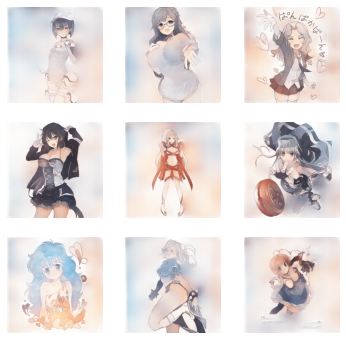

'\nBest output epochs so far - 31, 34\n'

In [139]:
# ======================================= Start training ======================================= #
train(g_model, d_model, gan_model, sketch_paths, img_paths, 100, seed_skets, seed_imgs, output_frequency=100, n_epochs=40, n_batch=8, init_epoch=30)
# ======================================= Start training ======================================= # 

"""
Best output epochs so far - 31, 34
"""

>43, 1778/1778, d1=0.325, d2=1.763 g=141.482
>Accuracy real: 0%, fake: 100%


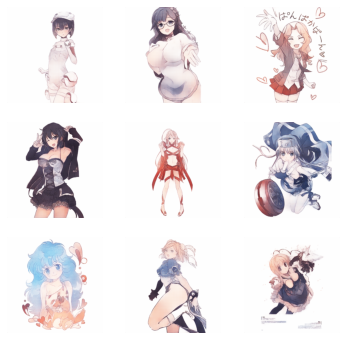

'\nBest output epochs so far - 43\n'

In [218]:
# ======================================= Start training ======================================= #
train(g_model, d_model, gan_model, sketch_paths, img_paths, 100, seed_skets, seed_imgs, output_frequency=100, n_epochs=43, n_batch=8, init_epoch=40)
# ======================================= Start training ======================================= # 

"""
Best output epochs so far - 43
"""

## Output of some sample sketches :

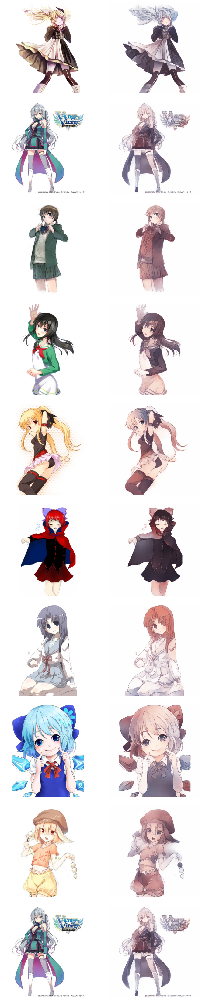

In [245]:
# import matplotlib


# sketch_paths1 = glob.glob('experiment/**.png')
# TOTAL_IMAGES1 = 6
# k = 6
# temp_skets = []
# # temp_imgs = []
# idxs = np.random.randint(2, TOTAL_IMAGES1-0, k)
# temp_skets.append(np.array(Image.open(sketch_paths1[0]).convert('RGB')))
# temp_skets.append(np.array(Image.open(sketch_paths1[1]).convert('RGB')))
# temp_skets.append(np.array(Image.open(sketch_paths1[2]).convert('RGB')))
# temp_skets.append(np.array(Image.open(sketch_paths1[3]).convert('RGB')))
# temp_skets.append(np.array(Image.open(sketch_paths1[4]).convert('RGB')))
# temp_skets.append(np.array(Image.open(sketch_paths1[5]).convert('RGB')))
# # for sket in zip(sketch_paths1[idxs]):
# #     print(sket)
# #     temp_skets.append(np.array(Image.open(sket).convert('RGB')))
# #     temp_imgs.append(np.array(Image.open(img).convert('RGB')))

# # temp_skets = np.array(temp_skets, dtype='float32')/127.5 - 1
# temp_skets = np.array(temp_skets, dtype='float32')/127.5 - 1
# pred = g_model.predict(temp_skets)
# pred = (pred+1)/2.0
# temp_skets = (temp_skets+1)/2.0

# f, a = plt.subplots(k, 2, figsize=(12,60))
# a = a.flatten()

# idx = 0
# for sket, pic in zip(temp_skets, pred):
#   matplotlib.image.imsave('./experiment/{}.png'.format(idx), pic)

#   a[idx].imshow(sket)
#   a[idx+1].imshow(pic)
#   a[idx].axis('off')
#   a[idx+1].axis('off')
#   idx += 2

# plt.subplots_adjust(wspace=.1, hspace=.1)
# plt.show()

sketch_paths1 = glob.glob('valData/Sketches/**.png')
img_paths1 = glob.glob('valData/Images/**.png')
img_paths1.sort()
sketch_paths1.sort()
img_paths1 = np.array(img_paths1)# [ids]
sketch_paths1 = np.array(sketch_paths1)# [ids]
k = 10
TOTAL_IMAGES1 = sketch_paths1.shape[0]
# print(sketch_paths)
temp_skets = []
temp_imgs = []
idxs = np.random.randint(1335, TOTAL_IMAGES1 - 1335, k)

for sket, img in zip(sketch_paths1[idxs], img_paths1[idxs]):
    temp_skets.append(np.array(Image.open(sket).convert('RGB')))
    temp_imgs.append(np.array(Image.open(img).convert('RGB')))

temp_skets = np.array(temp_skets, dtype='float32')/127.5 - 1

pred = g_model.predict(temp_skets)
pred = (pred+1)/2.0
temp_skets = (temp_skets+1)/2.0

f, a = plt.subplots(k, 2, figsize=(12,60))
a = a.flatten()

idx = 0
for img, sket, pic in zip(temp_imgs, temp_skets, pred):
#   matplotlib.image.imsave('./experiment/img{}.png'.format(idx), img)
#   matplotlib.image.imsave('./experiment/sket{}.png'.format(idx), sket)
#   matplotlib.image.imsave('./experiment/pic{}.png'.format(idx), pic)
  a[idx].imshow(img)
  a[idx+1].imshow(pic)
  a[idx].axis('off')
  a[idx+1].axis('off')
  idx += 2

plt.subplots_adjust(wspace=.1, hspace=.1)
plt.show()

In [0]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('Sketch2Image/generated_plot_e*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**10000)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [0]:
files.download(anim_file)

In [0]:
def saveModels(gan, generator, discriminator):
    discriminator.trainable = False
    save_model(gan, 'gan.h5')
    discriminator.trainable = True
    save_model(generator, 'generator.h5')
    save_model(discriminator, 'discriminator.h5')


def loadModels():
    discriminator = load_model('discriminator.h5')
    generator = load_model('generator.h5')
    gan = load_model('gan.h5')
    gan.summary()
    discriminator.summary()
    generator.summary()

    return gan, generator, discriminator

saveModels(gan_model, g_model, d_model)

In [0]:
from google.colab import files

files.download('generator.h5')
files.download('gan.h5')
files.download('discriminator.h5')